<a href="https://colab.research.google.com/github/susanaes/topicos_ciencia_datos/blob/Trabajo_Tarea1/Tarea1_Susana.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Análisis exploratorio de los datos 

In [54]:
from pandas import read_csv

In [55]:
url = "https://raw.githubusercontent.com/susanaes/topicos_ciencia_datos/master/tareas/tarea0001/datos0001.csv"

dataframe = read_csv(url)

In [56]:
#dataframe.describe()

Variabilidad de los datos

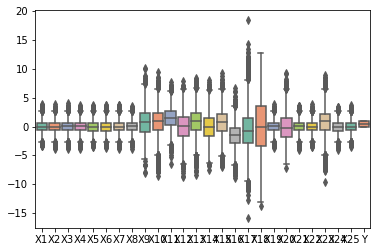

In [57]:
import seaborn as sns
ax = sns.boxplot(data=dataframe, orient="v", palette="Set2")

se observa que tenemos valores positivos y negativos (no podemos usar el de chi cuadrado porque mide la frecuencia , deben ser positivos)

no usaremos PCA porque tenemos mucha variablidad y precencia de oftlaiers 


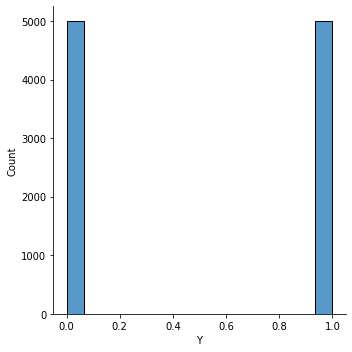

In [8]:
sns.displot(data=dataframe, x="Y")

La data esta balanceada

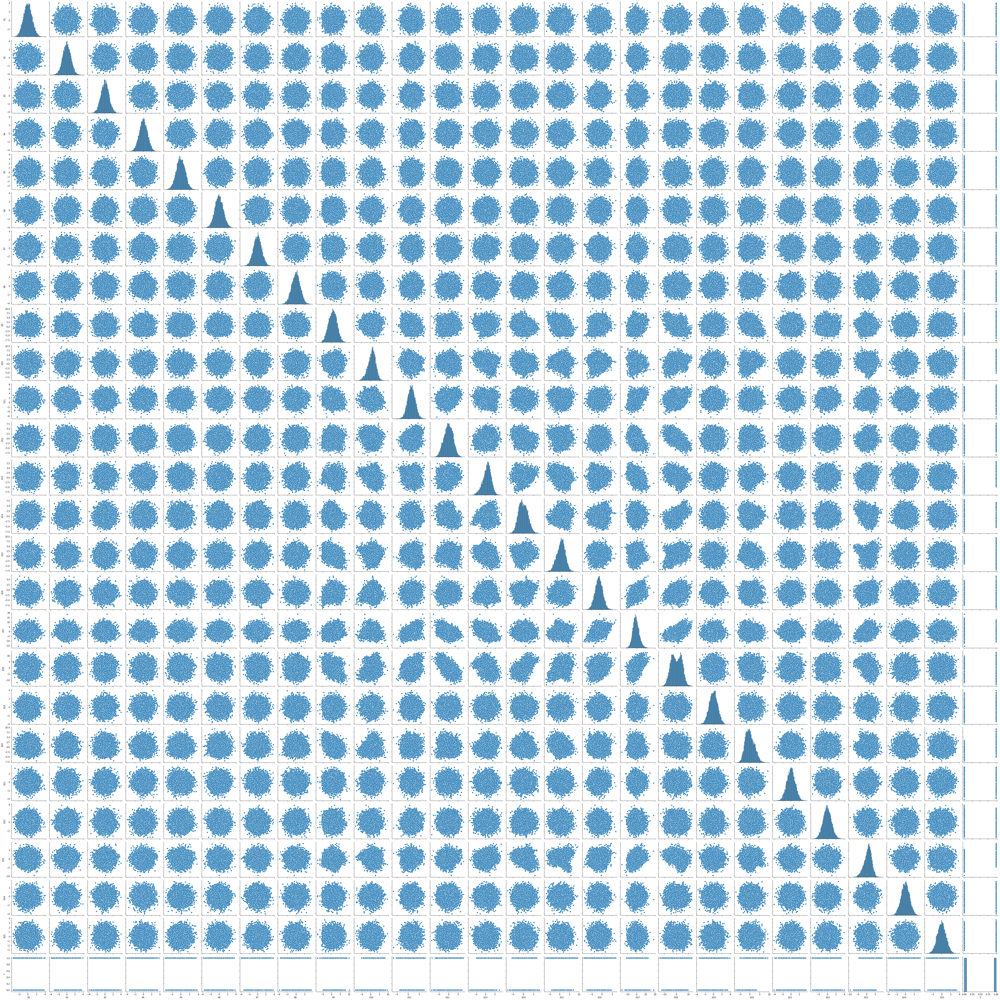

In [9]:
distribuciones=sns.pairplot(dataframe)

Se observa que algunas variables si estan correlacionadas , para esto nos servira la seleccion de varibles , eligiendo la que no estan correlacionadas y nos aportan mayor informacion y tambien podemos ver que las distribuciones univariantes de cada variables tienen tendencia normal.

En vista de lo anterior utilizaremos el metodo :

### **Feature Selection with RFE**


In [18]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [28]:
# separate array into input and output components
X = dataframe.iloc[:,0:25]
Y = dataframe.iloc[:,25]

como los datos cumplen las siguientes condiciones:

- una variable binaria de clasificacion.
- queremos predecir una categorias
- tenemos los datos etiquetados
utilizare  como estimador LogisticRegression


In [52]:
# feature extraction
model = LogisticRegression(solver='liblinear')
rfe = RFE(model, 4)
fit = rfe.fit(X, Y)
print("Num Features: %d" % fit.n_features_)
print("Selected Features: %s" % fit.support_)
print("Feature Ranking: %s" % fit.ranking_)

Num Features: 4
Selected Features: [False False False False False False False False False  True False False
  True False False False False False False  True False False  True False
 False]
Feature Ranking: [18 12 15 17 22 16 10 13  3  1  5  7  1  4  2  6 20  8 14  1 19 21  1  9
 11]


In [53]:
[i for i , e in enumerate(fit.support_) if e == True]

[9, 12, 19, 22]

Las variables seleccionadas son : X10 , X13, X20 , X23  , se desplazan una posicion porque los indices comienzan en 0